In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

In [2]:
df = pd.read_csv("Friday-02-03-2018_TrafficForML_CICFlowMeter.csv")

/Users/ada/venvs/cvirtual3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2728: DtypeWarning: Columns (16,17) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


## Let's have a look at the data

In [3]:
df['Timestamp'] = pd.to_datetime(df['Timestamp']).dt.time
df.head()

,Dst Port,Protocol,Timestamp,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,TotLen Fwd Pkts,TotLen Bwd Pkts,Fwd Pkt Len Max,Fwd Pkt Len Min,...,Fwd Seg Size Min,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label
0,443,6,08:47:38,141385,9,7,553,3773.0,202,0,...,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign
1,49684,6,08:47:38,281,2,1,38,0.0,38,0,...,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign
2,443,6,08:47:40,279824,11,15,1086,10527.0,385,0,...,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign
3,443,6,08:47:40,132,2,0,0,0.0,0,0,...,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign
4,443,6,08:47:41,274016,9,13,1285,6141.0,517,0,...,20,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Benign


##  Feature List

In [4]:
df.columns

Index(['Dst Port', 'Protocol', 'Timestamp', 'Flow Duration', 'Tot Fwd Pkts',
       'Tot Bwd Pkts', 'TotLen Fwd Pkts', 'TotLen Bwd Pkts', 'Fwd Pkt Len Max',
       'Fwd Pkt Len Min', 'Fwd Pkt Len Mean', 'Fwd Pkt Len Std',
       'Bwd Pkt Len Max', 'Bwd Pkt Len Min', 'Bwd Pkt Len Mean',
       'Bwd Pkt Len Std', 'Flow Byts/s', 'Flow Pkts/s', 'Flow IAT Mean',
       'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Tot',
       'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min',
       'Bwd IAT Tot', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
       'Bwd IAT Min', 'Fwd PSH Flags', 'Bwd PSH Flags', 'Fwd URG Flags',
       'Bwd URG Flags', 'Fwd Header Len', 'Bwd Header Len', 'Fwd Pkts/s',
       'Bwd Pkts/s', 'Pkt Len Min', 'Pkt Len Max', 'Pkt Len Mean',
       'Pkt Len Std', 'Pkt Len Var', 'FIN Flag Cnt', 'SYN Flag Cnt',
       'RST Flag Cnt', 'PSH Flag Cnt', 'ACK Flag Cnt', 'URG Flag Cnt',
       'CWE Flag Count', 'ECE Flag Cnt', 'Down/Up Ratio', 'Pkt Size Avg',
      

## What do we know about bot nets? 

* Often use high ports.
* Localized up/download packet size.
* up/download happens at the same time every day.
* tend to beakon out.
* network jitter (interpacket arrival time) is high because normal desktop computers are used as servers.


## Label distribution between  benign and bot 

In [5]:
df.Label.value_counts()

Benign    762384
Bot       286191
Name: Label, dtype: int64

Note: overrepresented number of malicious entries!

## Throw away featrues with only one value 

In [6]:

for column in df.columns:
    if len(df[column].unique())==1:
        df = df.drop(column, axis=1)
        print("dropped {}".format(column))
        
    elif len(df[column].unique())==2:
        n=df[column].value_counts()
        print("column {} has only two vals".format(column))
        print(n)


column Fwd PSH Flags has only two vals
0    1016657
1      31918
Name: Fwd PSH Flags, dtype: int64
dropped Bwd PSH Flags
dropped Fwd URG Flags
dropped Bwd URG Flags
column FIN Flag Cnt has only two vals
0    1044701
1       3874
Name: FIN Flag Cnt, dtype: int64
column SYN Flag Cnt has only two vals
0    1016657
1      31918
Name: SYN Flag Cnt, dtype: int64
column RST Flag Cnt has only two vals
0    771321
1    277254
Name: RST Flag Cnt, dtype: int64
column PSH Flag Cnt has only two vals
0    569243
1    479332
Name: PSH Flag Cnt, dtype: int64
column ACK Flag Cnt has only two vals
0    697815
1    350760
Name: ACK Flag Cnt, dtype: int64
column URG Flag Cnt has only two vals
0    1016741
1      31834
Name: URG Flag Cnt, dtype: int64
dropped CWE Flag Count
column ECE Flag Cnt has only two vals
0    771320
1    277255
Name: ECE Flag Cnt, dtype: int64
dropped Fwd Byts/b Avg
dropped Fwd Pkts/b Avg
dropped Fwd Blk Rate Avg
dropped Bwd Byts/b Avg
dropped Bwd Pkts/b Avg
dropped Bwd Blk Rate Avg

## Throw away missing value columns

In [7]:
df = df.drop(df.columns[16:18], axis=1)

## Specifiy feature types 

In [8]:
# Feature types
# we initalize with nominal becaues most feature types are nominal. 
type_dict = dict(zip(df.columns, ['nominal']*len(df.columns)))

# only dst port and protocol are categorical data
type_dict['Dst Port'] = 'categorical'
type_dict['Protocol'] = 'categorical'
type_dict['Label'] = 'label'
type_dict['Timestamp'] = 'time'


In [9]:
df['numerical_label'] = [ 0 if label == 'Benign' else 1 for label in df.Label.values]
type_dict['numerical_label'] = 'nominal'

## Use smaller sample of data 

In [53]:
dg = df.sample(frac=0.1)

In [54]:
print(len(dg))
print(len(df))

104858
1048575


In [55]:
dg.Label.value_counts()

Benign    76478
Bot       28380
Name: Label, dtype: int64

## Check correlations

In [13]:
from scipy.stats import pearsonr 
import matplotlib.pyplot as plt 
%config InlineBackend.figure_format = 'retina'

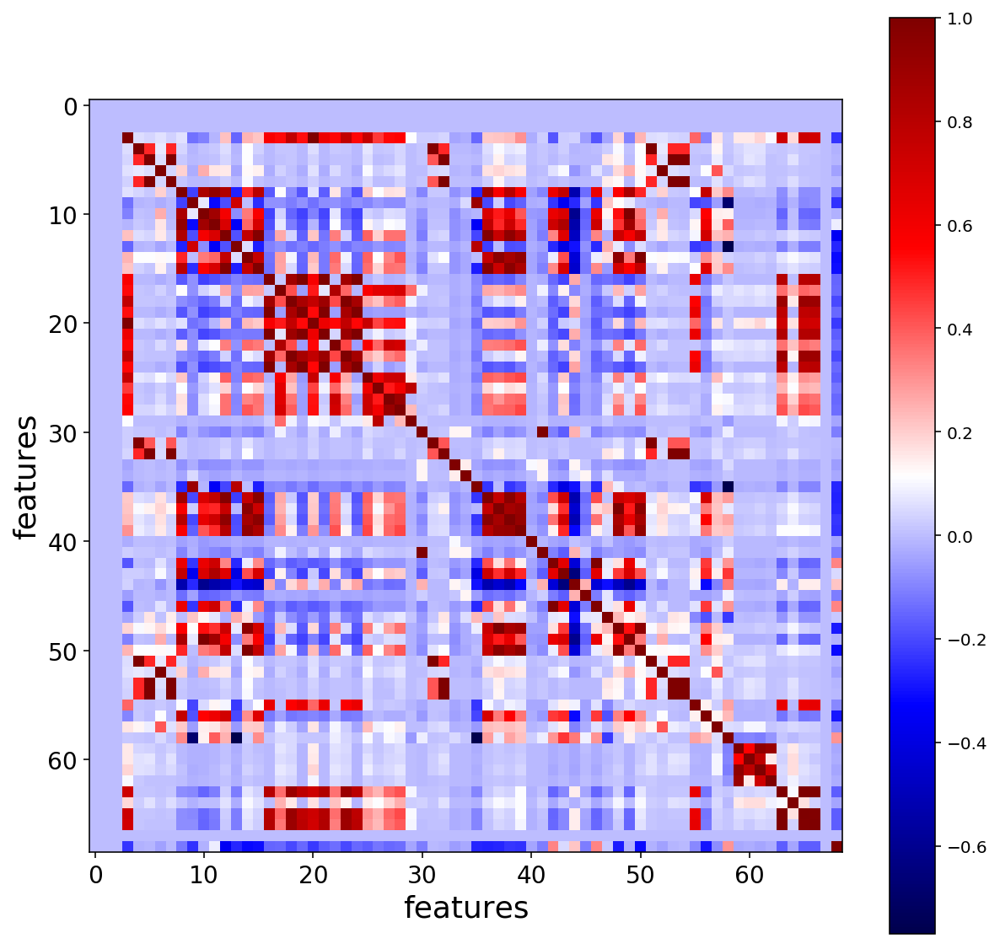

In [57]:
n=len(df.columns)
pij = np.zeros((n,n))
for i,col_i in enumerate(dg.columns):
    for j,col_j in enumerate(dg.columns):
        if type_dict[col_i] == 'nominal' and type_dict[col_j] == 'nominal':
            pij[i,j] = pearsonr(dg[col_i].values, dg[col_j].values)[0]
            
fig,ax = plt.subplots(figsize=(10,10))
img = plt.imshow(pij, cmap='seismic', interpolation='nearest')
fig.colorbar(img, ax=ax)
plt.xlabel("features", size=18)
plt.ylabel("features", size=18)
ax.tick_params(axis='both', which='major', labelsize=14)
plt.show()
    
    


### Drop identical features

In [58]:
list_identical = [i for i in range(len(pij)) for j in range(len(pij)) if i<j and pij[i,j] > 0.99]  
dg = dg.drop(df.columns[list_identical], axis=1)

In [59]:
len(dg.columns)

51

## Correlations with label 

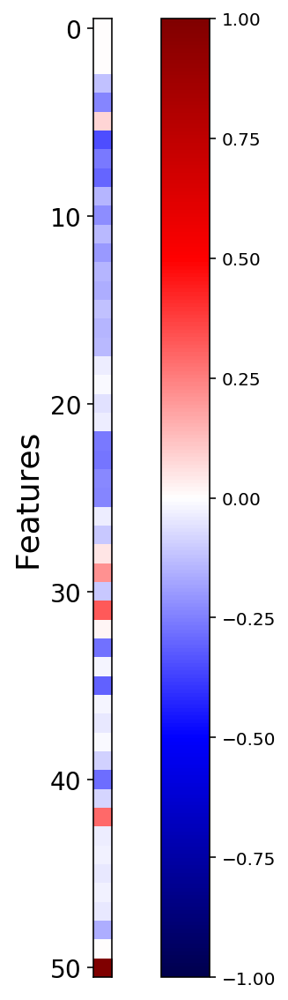

In [64]:
n=len(dg.columns)
pi = np.zeros(n)
for i,col_i in enumerate(dg.columns):
    if type_dict[col_i] == 'nominal':
        pi[i] = pearsonr(dg[col_i].values, dg.numerical_label.values)[0]
            
fig,ax = plt.subplots(figsize=(10,10))
img = plt.imshow(np.reshape(pi, (-1,1)), cmap='seismic', interpolation='nearest', vmin=-1, vmax=1)
fig.colorbar(img, ax=ax)
ax.tick_params(axis='y', which='major', labelsize=14)
plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
plt.ylabel("Features", size=18)
plt.show()

## Does our botnet use high ports?

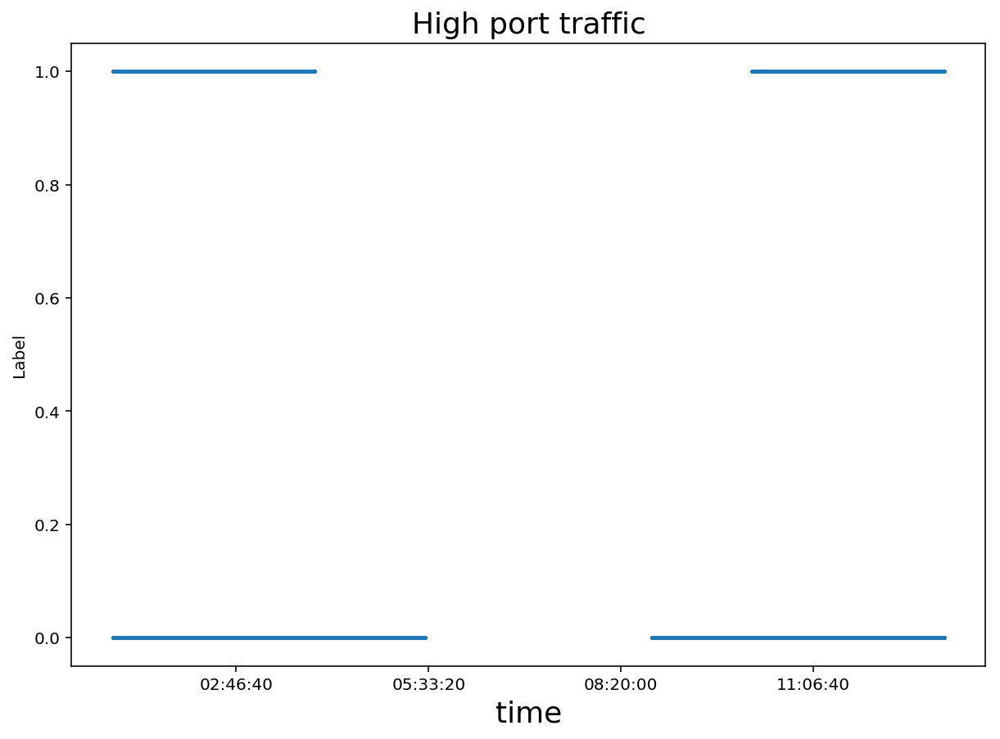

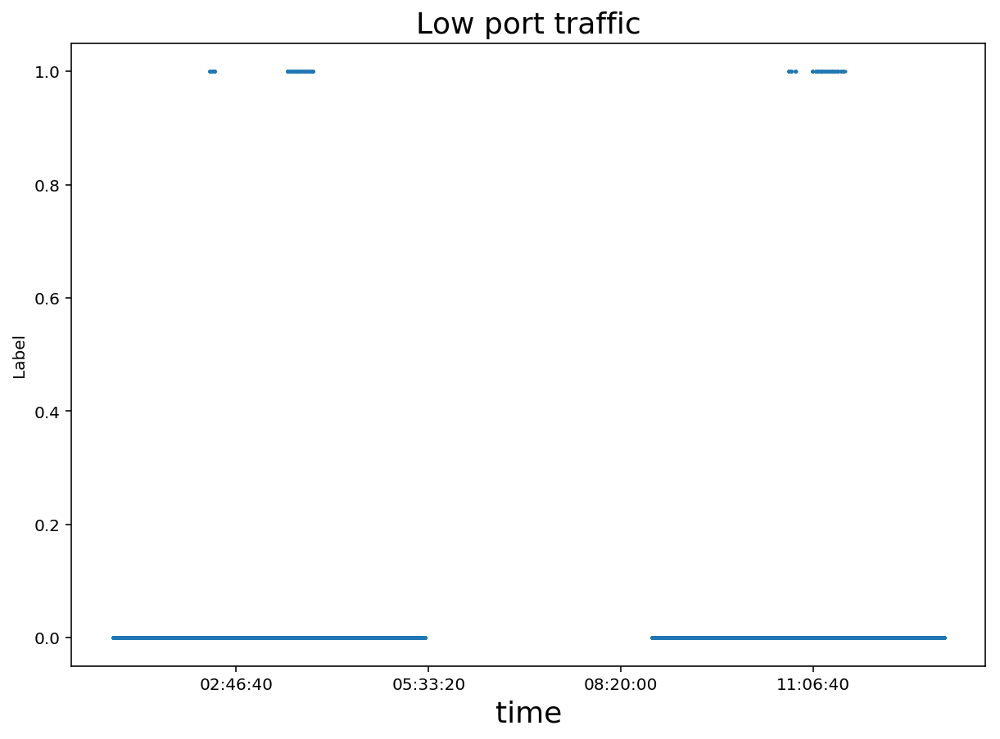

In [70]:
d_tmp = df[df['Dst Port'] > 1023]
fig, ax = plt.subplots(figsize=(10,7))
plt.title("High port traffic", size=18)
plt.plot(d_tmp.Timestamp.values, d_tmp['numerical_label'].values, lw=0, ms=1, marker='o')
plt.xlabel("time", size=18)
plt.ylabel("Label")

d_tmp = df[df['Dst Port'] < 1023]
fig, ax = plt.subplots(figsize=(10,7))
plt.title("Low port traffic", size=18)
plt.plot(d_tmp.Timestamp.values, d_tmp['numerical_label'].values, lw=0, ms=1, marker='o')
plt.xlabel("time", size=18)
plt.ylabel("Label")


plt.show()

In [19]:
len(df[df.Label == 'Bot']['Dst Port'].unique())

1358

In [20]:
len(df[df.Label == 'Benign']['Dst Port'].unique())

37304

###  What is the correlation of very similar features?

Populating the interactive namespace from numpy and matplotlib


/Users/ada/venvs/cvirtual3/lib/python3.6/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['pi']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


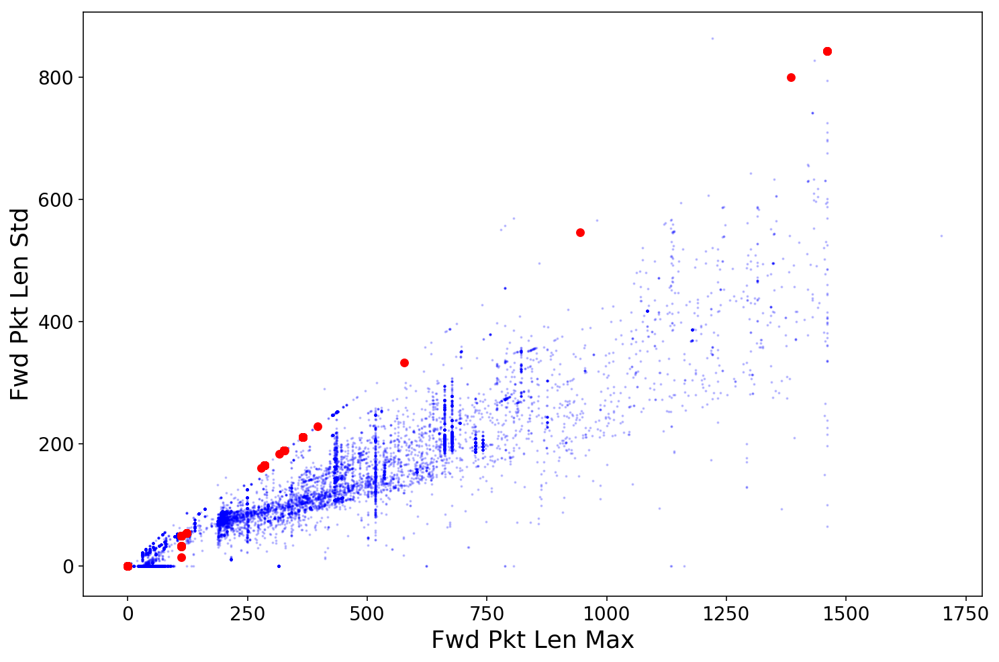

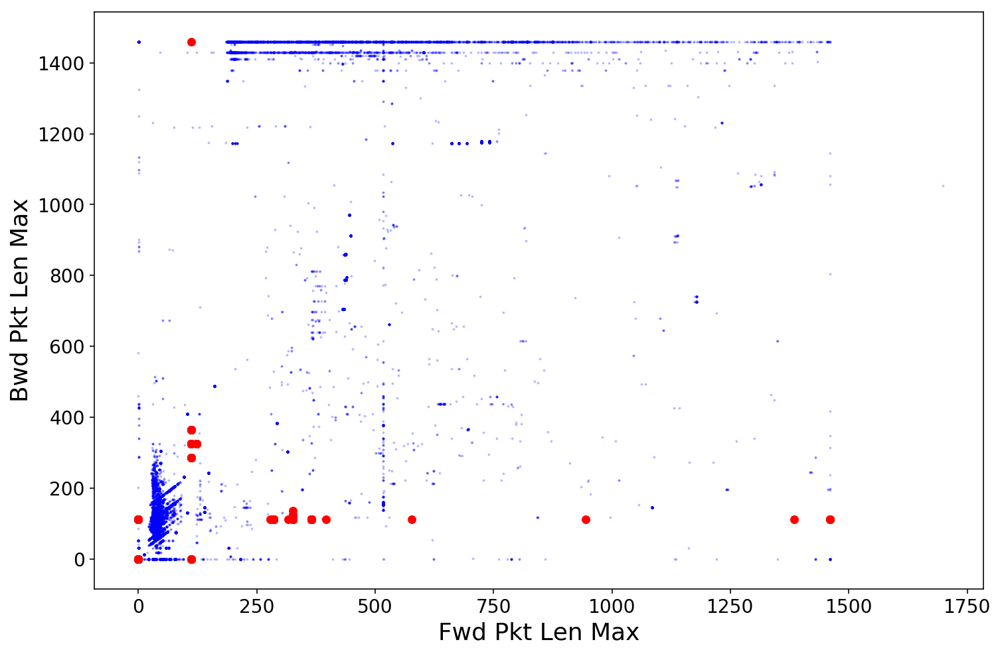

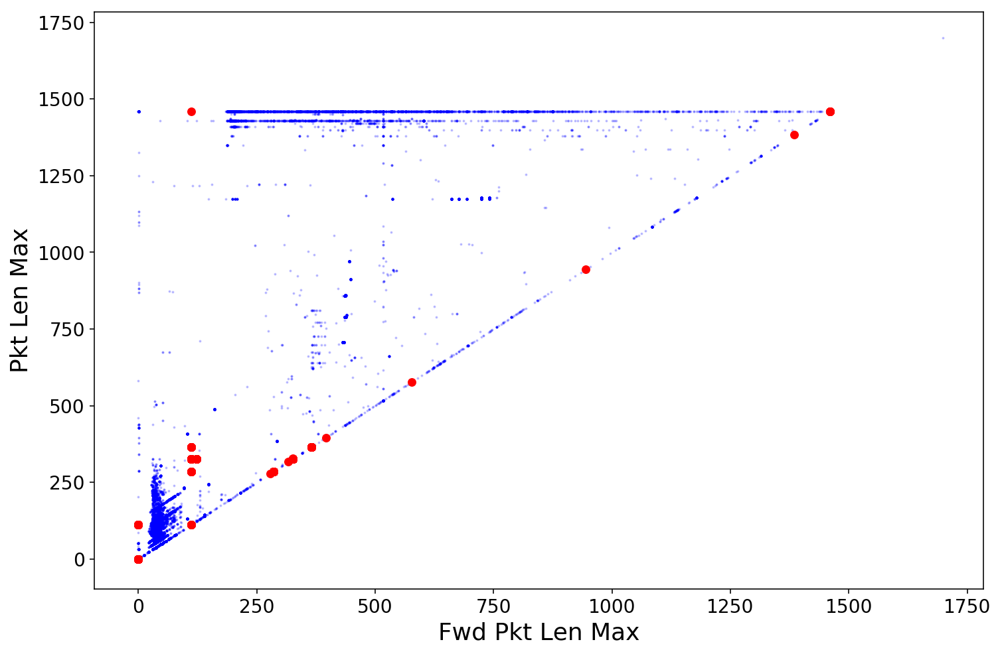

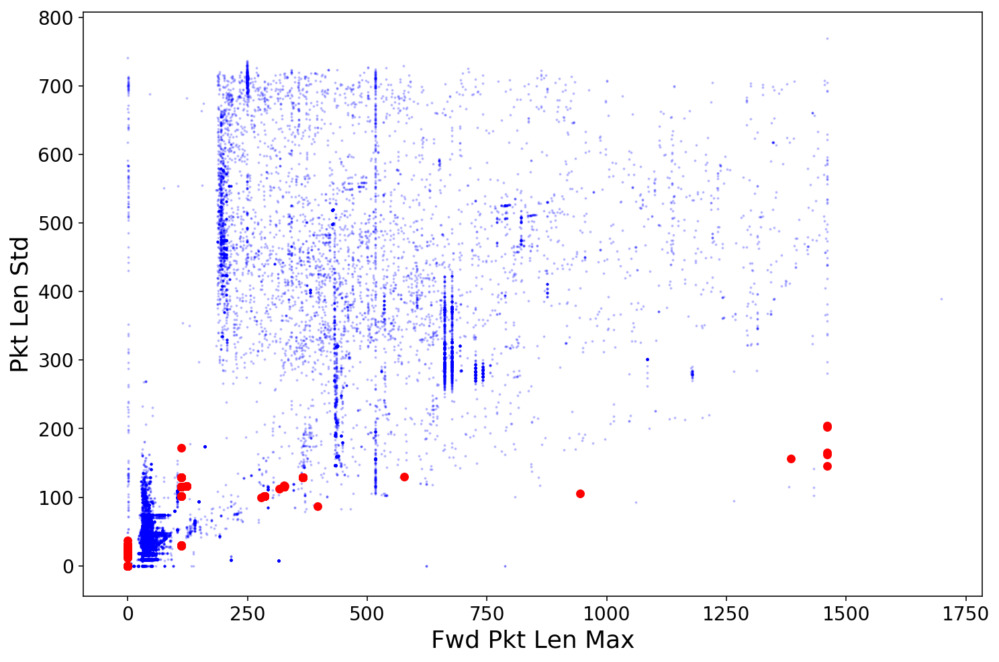

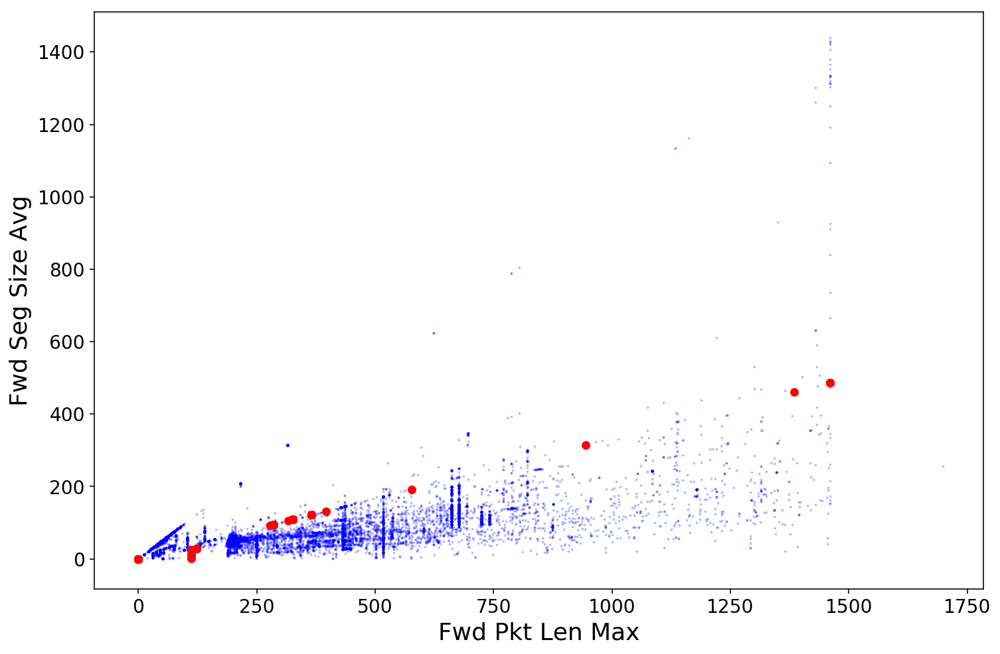

...

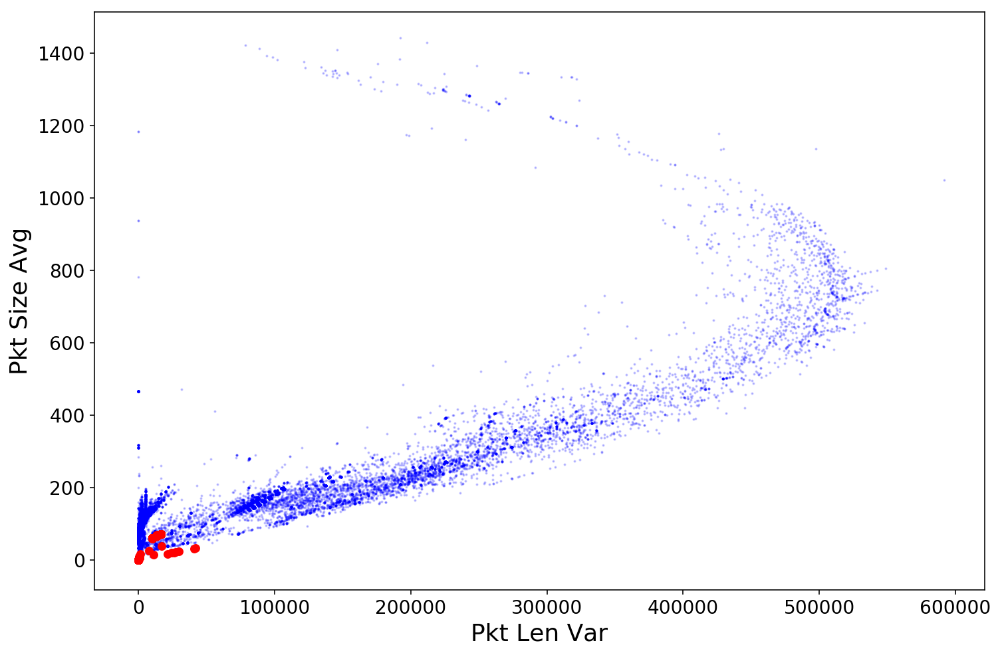

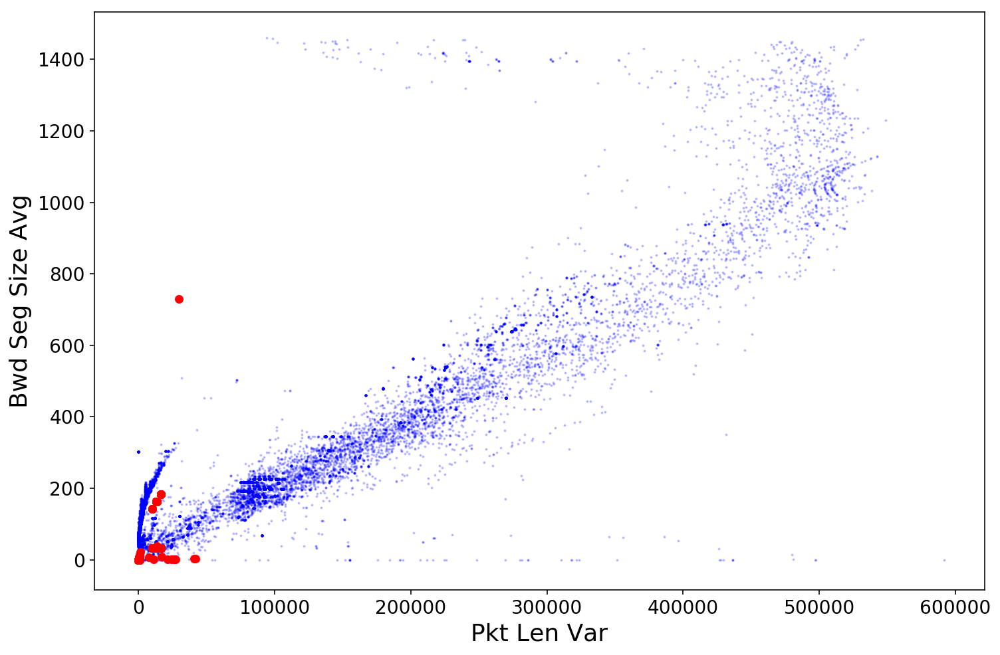

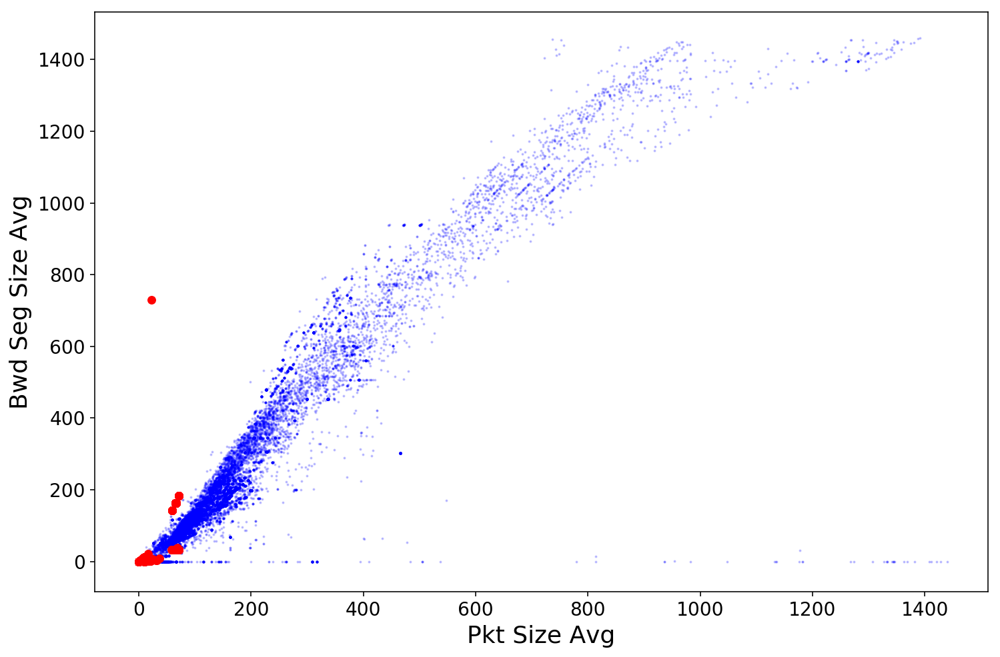

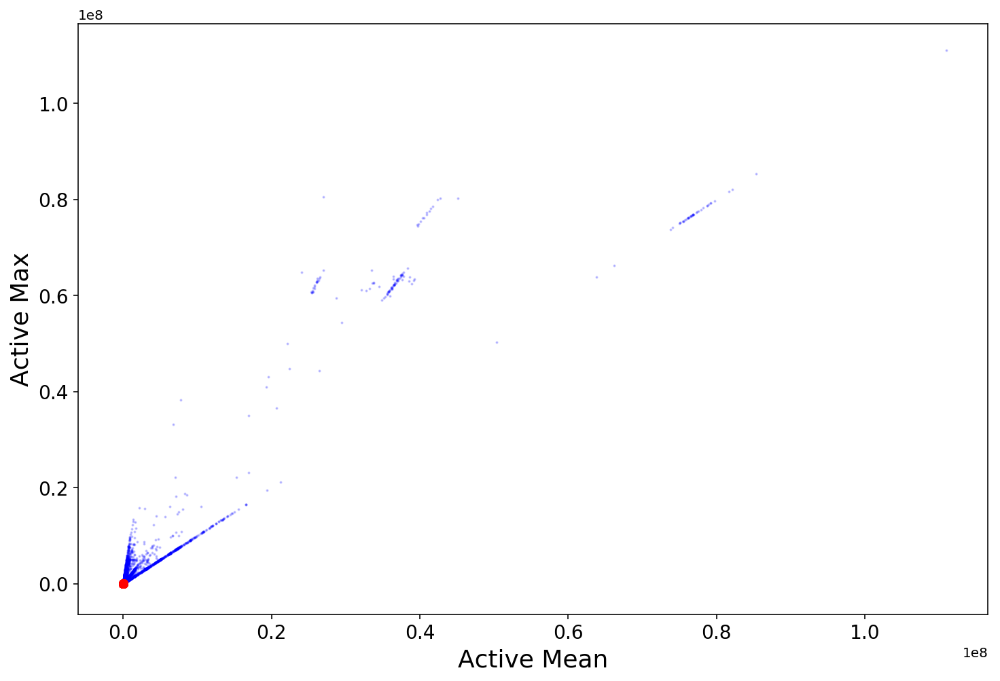

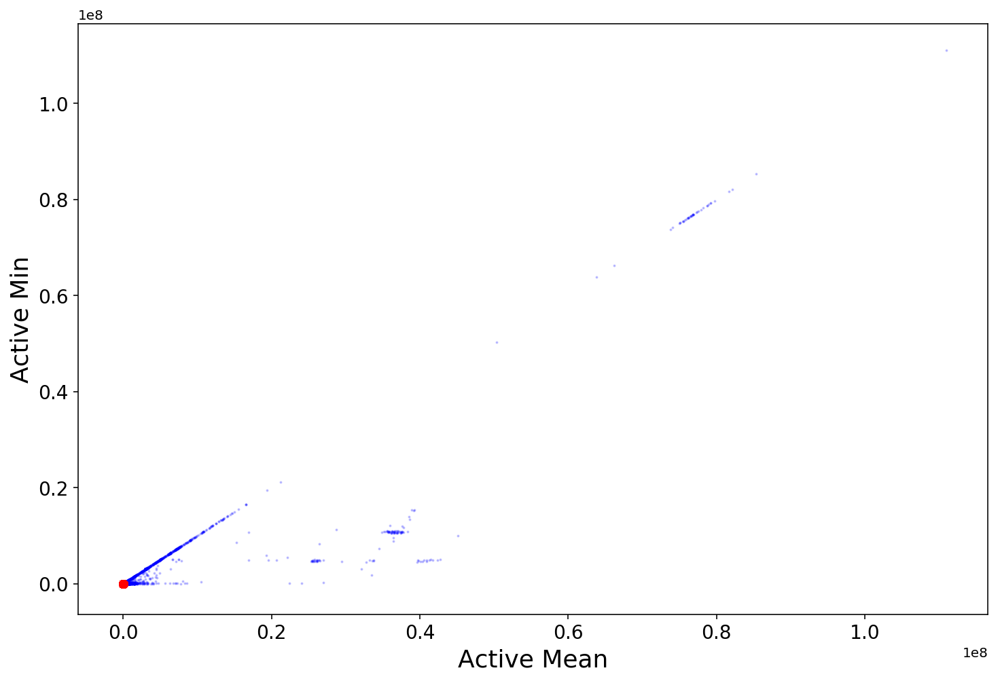

In [71]:
%pylab inline 

n=len(df.columns)
pij = np.zeros((n,n))
for i,col_i in enumerate(dg.columns):
    for j,col_j in enumerate(dg.columns):
        if i<j and type_dict[col_i] == 'nominal' and type_dict[col_j] == 'nominal':
            ai = dg[col_i].values
            aj = dg[col_j].values
            if np.fabs(pearsonr(ai,aj)[0])>0.8:
                fig,ax = plt.subplots(figsize=(12,8))
                plt.scatter(dg[dg.numerical_label==0][col_i].values, dg[dg.numerical_label==0][col_j].values, c='b', s=1, alpha=0.2)
                plt.scatter(dg[dg.numerical_label==1][col_i].values, dg[dg.numerical_label==1][col_j].values, c='r', s=30)
                ax.tick_params(axis='both', which='major', labelsize=14)
                plt.xlabel(col_i, size=18)
                plt.ylabel(col_j, size=18)
                plt.show()
            


## How does the feature space look embedded in 2D? 
As we can see it discerns well between bot or not. 
The stringy elements in the TSNE embedding are due to the sequentiality of the data.
Note that there are single outliers as well as connected regions of bot traffic in the embedding. 

In [24]:
from MulticoreTSNE import MulticoreTSNE as TSNE

tsne = TSNE(n_jobs=4)
dg = dg.drop(['Timestamp','Label','numerical_label'], axis=1)

Y = tsne.fit_transform(dg.values)


In [26]:
tsne_labels = label
np.savetxt("tsne_features.dat",Y)
np.savetxt("tsne_labels.dat", tsne_labels)

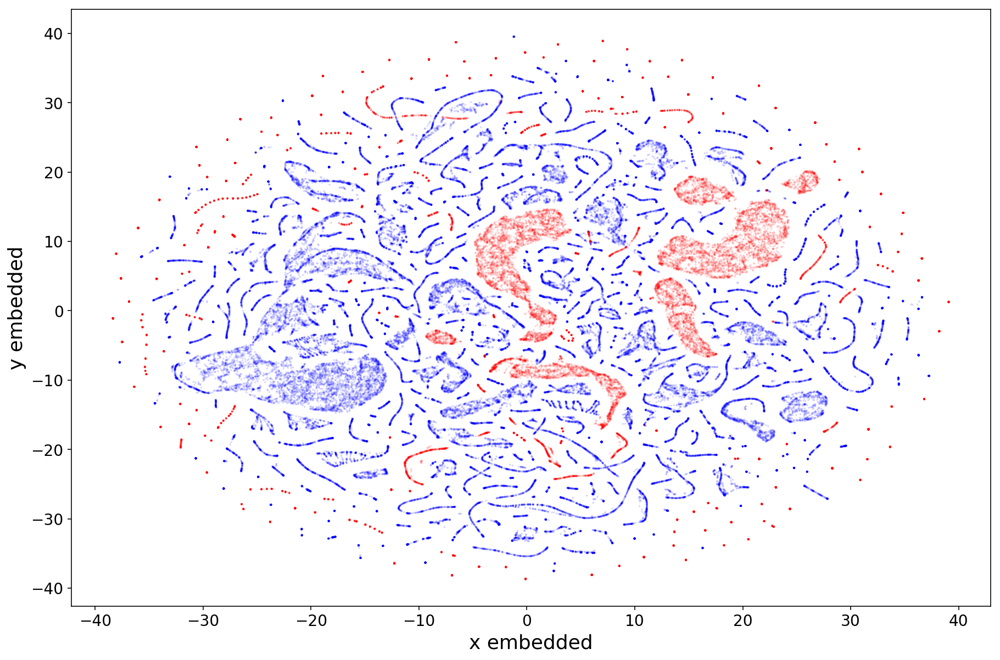

In [51]:
#Y = np.loadtxt('tsne_features.dat')
fig, ax = plt.subplots(figsize=(15,10))
plt.scatter(Y[:,0],Y[:,1],c=label, cmap=plt.cm.bwr, s=1, alpha=0.1)
plt.xlabel("x embedded", size=18)
plt.ylabel("y embedded", size=18)
ax.tick_params(axis='both', which='major', labelsize=14)

plt.show()

## Time and histogram plots for remaining features

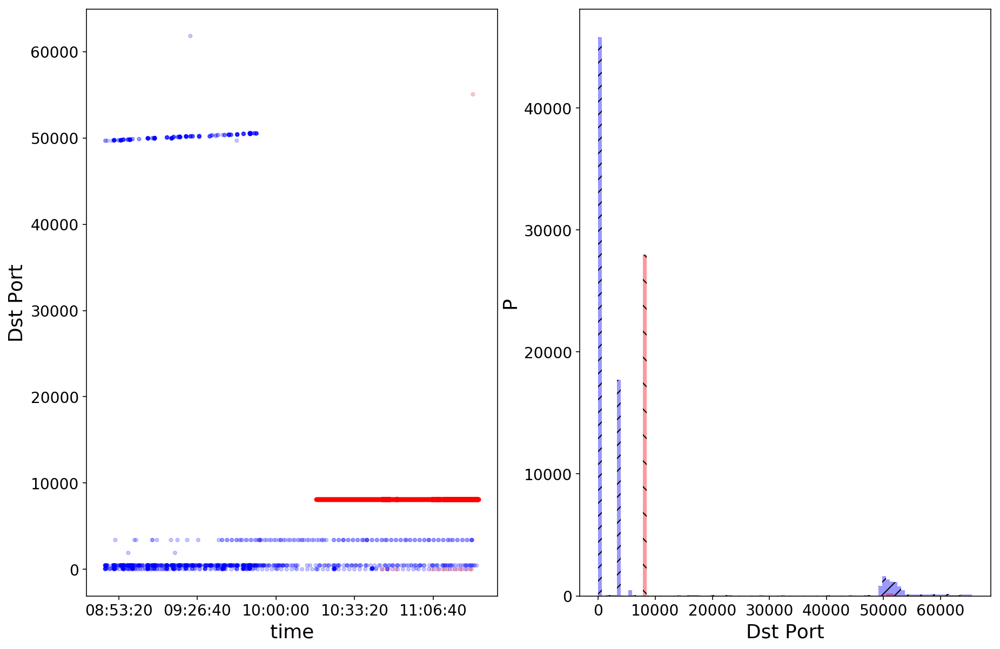

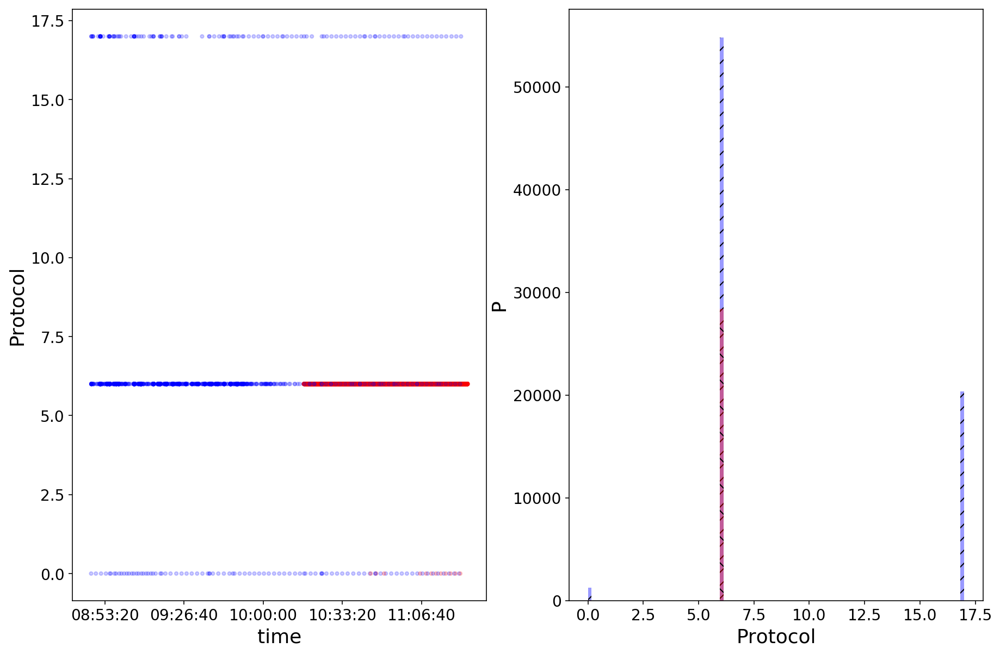

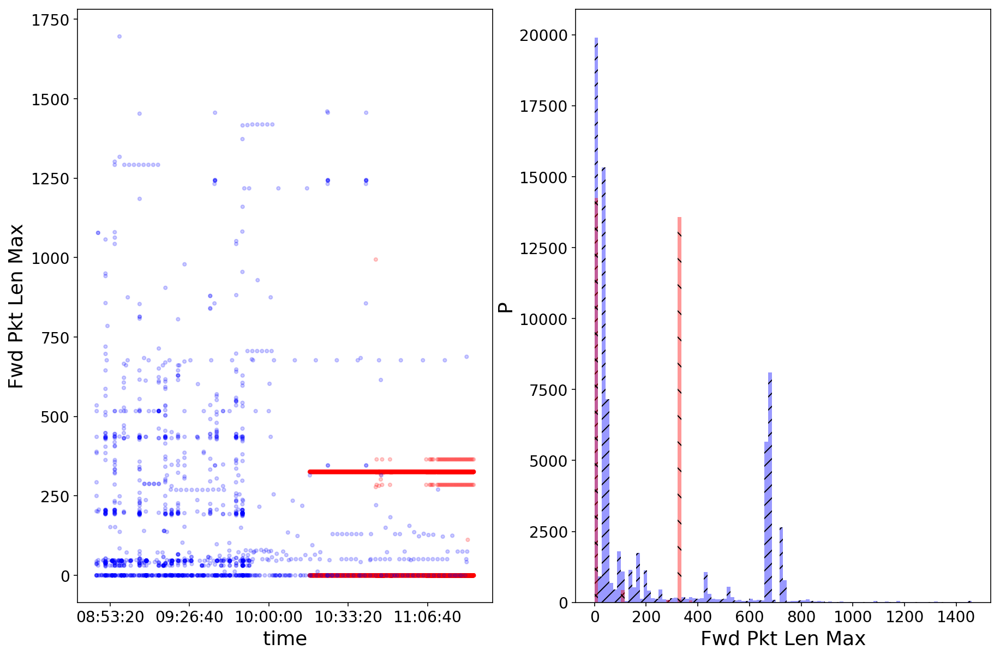

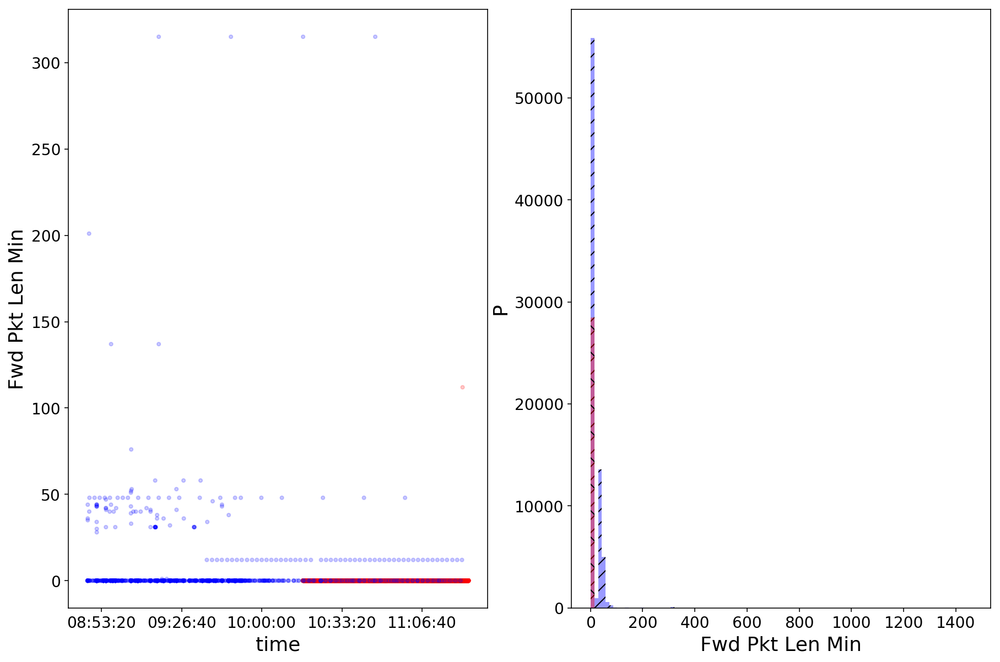

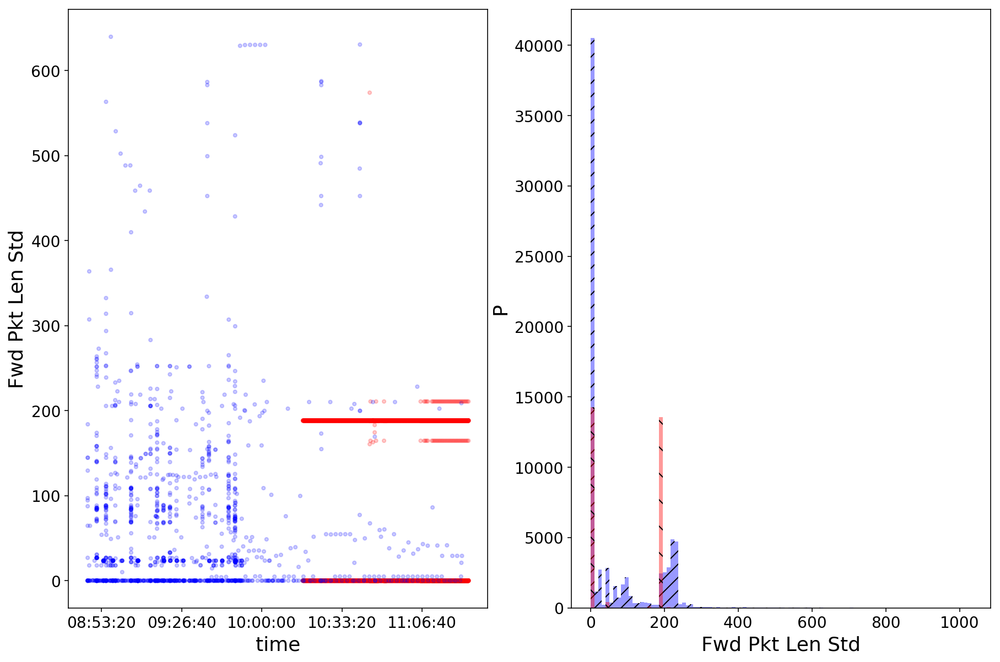

...

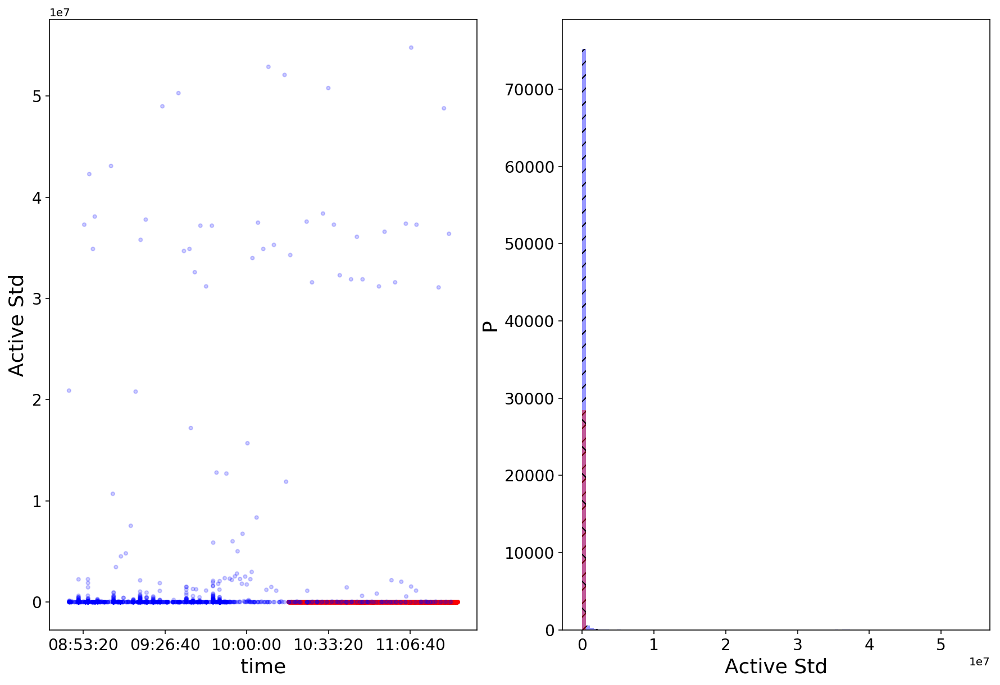

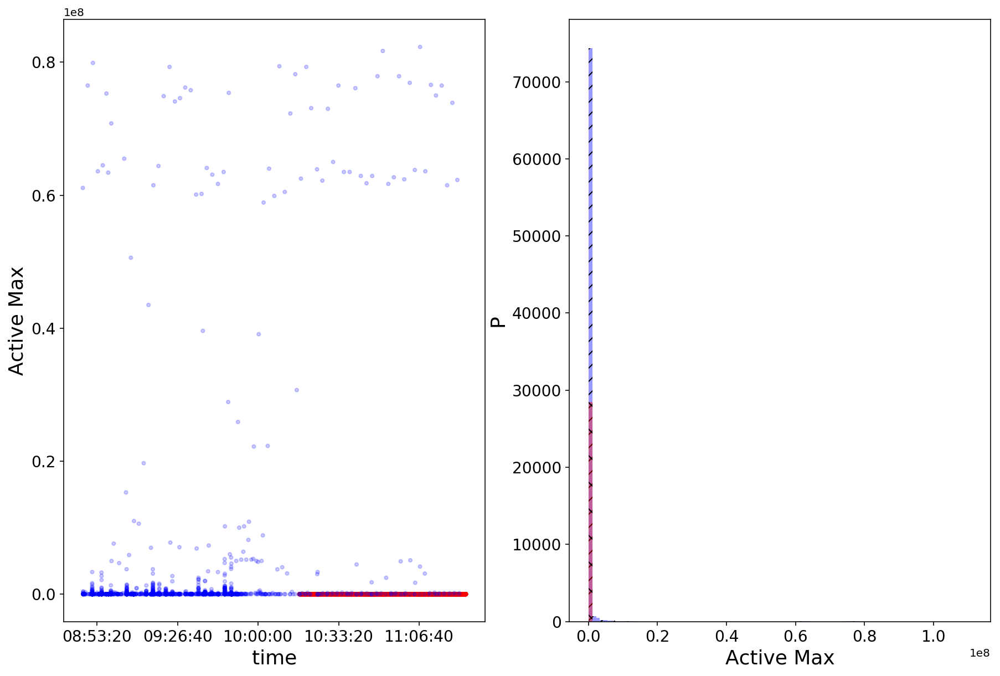

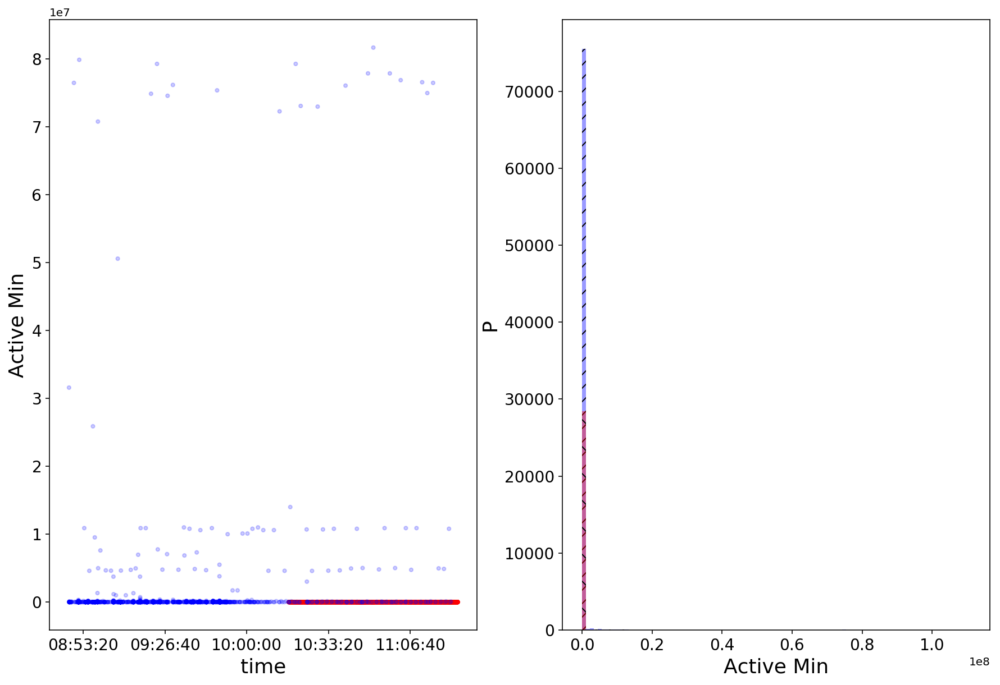

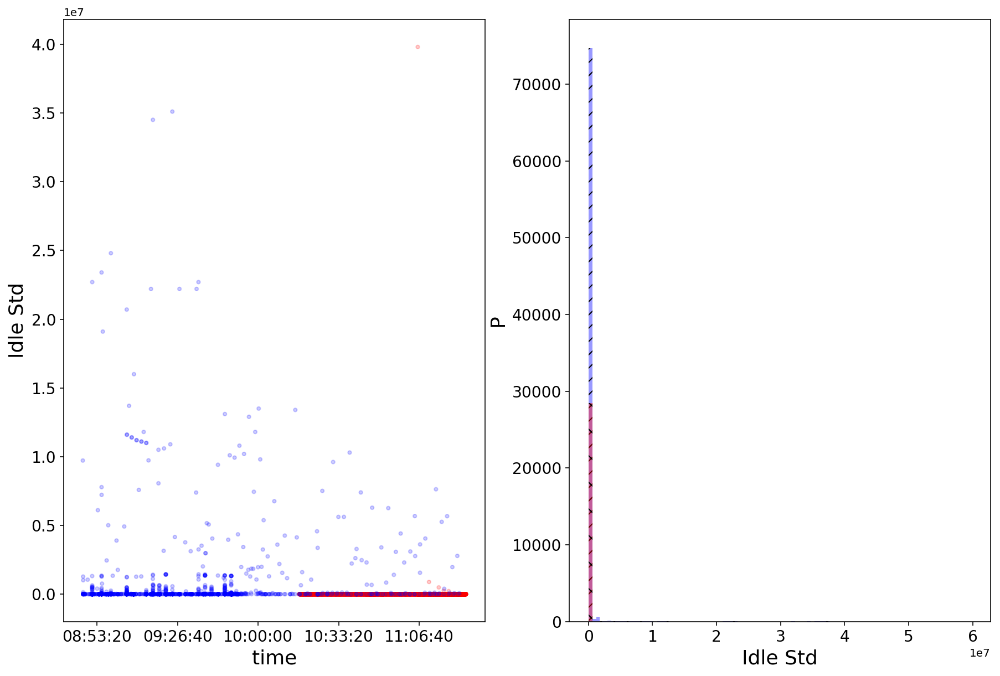

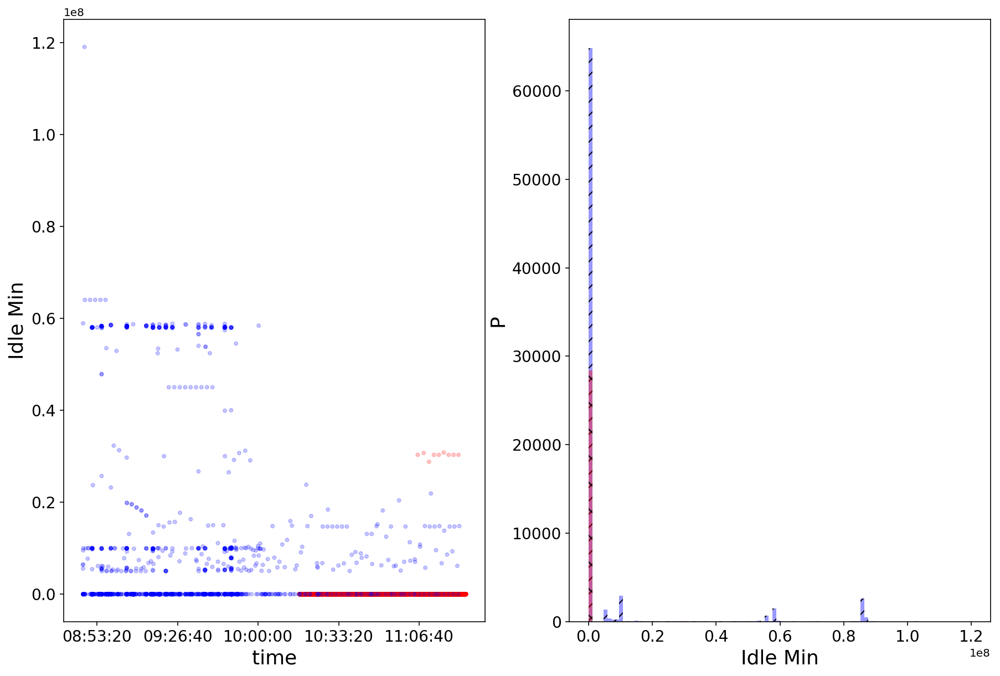

In [43]:
for column in dg.columns:
    fig,(ax1,ax2) = plt.subplots(1,2,figsize=(15,10))
    ax1.scatter(df.Timestamp.values[:10000], df[column].values[:10000],
                c=df.numerical_label[:10000],cmap=plt.cm.bwr,s=10, alpha=0.2)
    ax1.set_ylabel(column, size=18)
    ax1.set_xlabel('time', size=18)
    ax1.tick_params(axis='both', which='major', labelsize=14)
   
    n, bins, patches = ax2.hist(dg[column].values[label==0], facecolor='b', alpha=0.4, hatch='//',bins=100)
    _,_,_ = ax2.hist(dg[column].values[label==1], facecolor='r', alpha=0.4, hatch='\\', bins=bins)
    ax2.set_ylabel('P', size=18)
    ax2.set_xlabel(column, size=18)
    ax2.tick_params(axis='both', which='major', labelsize=14)
    
    plt.show()
    
 

## Select features
Features are selected according to their significance to discern between labels in the time and histogram plots above.
Note that we predominantly used port and packet related features. 

In [31]:
selected_list = ['Dst Port', 'Protocol', 'Fwd Pkt Len Max', 'Fwd Pkt Len Std', 'Bwd Pkt Len Max', 'Bwd Pkt Len Std',
'Pkt Len Max', 'Pkt Len Std', 'Pkt Size Avg', 'Fwd Seg Size Avg', 'Bwd Seg Size Avg',
'Pkt Len Var', 'Init Fwd Win Byts', 'Init Bwd Win Byts']

features = dg[selected_list]

In [46]:
def cf2(
        labels: list,
        predictions: list,
        rates: bool = False) -> pd.DataFrame:
    """
    """
    labels = pd.Series(labels).rename('truth')
    predictions = pd.Series(predictions).rename('prediction')

    if not rates:
        return pd.crosstab(labels, predictions)

    return pd.crosstab(labels, predictions) \
        .transform(lambda x: x / labels.value_counts()) \
        .rename_axis('truth')

## Now the machine learning! 

In [32]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis

X_train, X_test, y_train, y_test = \
        train_test_split(features, label, test_size=.2, random_state=42)

classifiers = [
    KNeighborsClassifier(16),
    #SVC(kernel="linear", C=0.025),
    RandomForestClassifier(max_depth=5, n_estimators=10, class_weight='balanced'),
    MLPClassifier(alpha=1)]

names = ["Nearest Neighbors", "Random Forest", "Neural Net"]

from collections import defaultdict
predictions = defaultdict(np.array)

for name, clf in zip(names, classifiers):
    clf.fit(X_train, y_train)
    predictions[name] = clf.predict(X_test)
    score = clf.score(X_test, y_test)
    print(name, score)
    


Nearest Neighbors 0.9994754911310318
Random Forest 0.9995708563799351
Neural Net 0.9966622162883845


In [49]:
for name in names:
    df_conf = cf2(y_test, predictions[name], True)
    print(name)
    print(df_conf)
    print()

Nearest Neighbors
prediction         0         1
truth                         
0           0.999804  0.000196
1           0.001420  0.998580

Random Forest
prediction         0         1
truth                         
0           0.999935  0.000065
1           0.001420  0.998580

Neural Net
prediction         0         1
truth                         
0           0.996088  0.003912
1           0.001775  0.998225



In [50]:
from sklearn.ensemble import IsolationForest
from sklearn.metrics import confusion_matrix

clf = IsolationForest(max_samples=100, contamination=0.3)

clf.fit(X_train)
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)

df_conf = cf2(y_test, y_pred_test, True)
print(df_conf)

prediction        -1         1
truth                         
0           0.411032  0.588968
1           0.020408  0.979592
